<a href="https://colab.research.google.com/github/Yi3912048/YI_Reinforcement_Learning/blob/main/1226_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# https://note.com/npaka/n/n70fa5b95700c
# StableBaseLine3

In [2]:
!apt update
!apt install xvfb

Hit:1 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:11 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:13 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic 

In [3]:
!pip install pyvirtualdisplay

from pyvirtualdisplay import Display

d = Display()
d.start()

In [4]:
### stable baselines3

In [5]:
!pip install stable-baselines3[extra]

In [6]:
### method-01

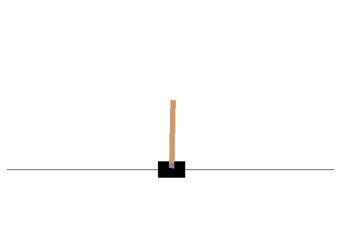

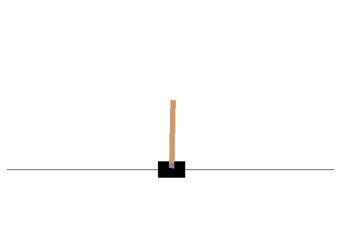

In [7]:
import gym

from stable_baselines3 import PPO
from stable_baselines3.ppo import MlpPolicy

from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt

### display
d = Display()
d.start()

### create env.
env = gym.make('CartPole-v1')

### create model
model = PPO('MlpPolicy',env,verbose=1)

### train model
model.learn(total_timesteps=10000)

### image-matrix
img = plt.imshow(env.render(mode='rgb_array'))

### test model
obs = env.reset()
for i in range(1000):
    action, _states = model.predict(obs, deterministic=True)
    obs,reward,done,info = env.step(action)

    display.clear_output(wait=True)
    img.set_data(env.render(mode='rgb_array'))
    plt.axis('off')
    display.display(plt.gcf())
    if d:
        env.reset()

env.close()

In [8]:
### method-02

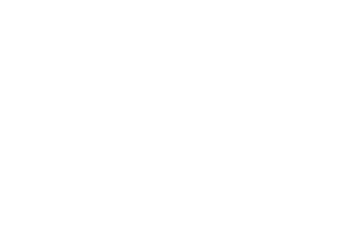

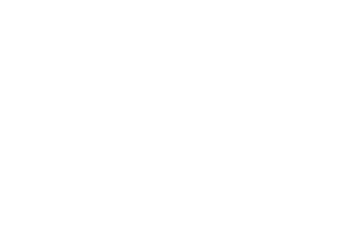

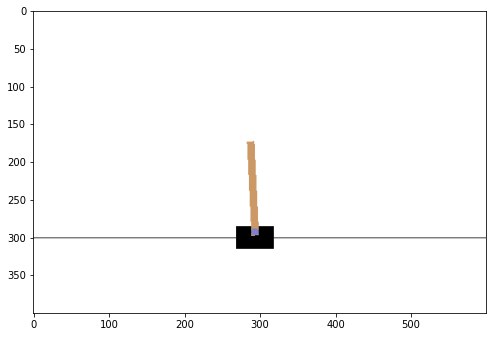

In [10]:
import gym

from stable_baselines3 import PPO
from stable_baselines3.ppo import MlpPolicy

from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt
from matplotlib import animation

### display
d = Display()
d.start()

### create env.
env = gym.make('CartPole-v1')

### create model
model = PPO('MlpPolicy',env,verbose=1)

### train model
model.learn(total_timesteps=10000)

### image-matrix
# img = plt.imshow(env.render(mode='rgb_array'))
img = []

### test model
obs = env.reset()
for i in range(1000):
    action, _states = model.predict(obs, deterministic=True)
    obs,reward,done,info = env.step(action)

    display.clear_output(wait=True)
    img.append(env.render(mode='rgb_array'))
    plt.axis('off')
    display.display(plt.gcf())
    if d:
        env.reset()

env.close()

### make animation
dpi = 72
interval = 50 # ms
plt.figure(figsize=(img[0].shape[1]/dpi,img[0].shape[0]/dpi),dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(),animate,frames=len(img),interval=interval)
display.display(display.HTML(ani.to_jshtml()))

In [ ]:
### org

In [ ]:
# import gym

# from stable_baselines3 import PPO
# from stable_baselines3.ppo import MlpPolicy

# env = gym.make('CartPole-v1')

# model = PPO('MlpPolicy', env, verbose=1)
# model.learn(total_timesteps=10000)

# obs = env.reset()
# for i in range(1000):
#     action, _states = model.predict(obs, deterministic=True)
#     obs, reward, done, info = env.step(action)
#     env.render()
#     if done:
#       obs = env.reset()

# env.close()